Link do notatnika: https://drive.google.com/file/d/1DArn_3zI-IBXy8ZUFt9HYvndQPzbS1it/view?usp=sharing

---



<h1>ZMGSN Lista 1 - Generative Adversarial Network (GAN)</h1>

<h2>Opis zadania</h2>

W ramach zadania należy:
<ol>
<li>Zapoznać się z poniższym eksperymentem z wykorzystaniem modelu DCGAN</li>
<li>Dokonać analizy wpływu hiperparametrów eksperymentu, np. kroku uczenia, rozmiaru pakietu (ang. <i>batch size</i>), liczby epok na wyniki modelu GAN</li>
<li>Dokonać modyfikacji architektury modelu DCGAN (generatora i dyskryminatora) w celu zbadania wpływu architektury na wyniki</li>
<li>Dokonać ewaluacji innych wariantów sieci GAN, np. CycleGAN, LAPGAN, SRGAN itp. (co najmniej 2 inne modele oprócz DCGAN)</li>
<li>Opracować procedurę ewaluacji jakości działania modeli GAN, uwzględniającą różne metody wizualizacji (np. wykresy, miary, klasy), klasteryzacji, redukcji wymiarów (np. t-SNE)</li>
</ol>

Ocenie podlegać będzie jakość wykonania zadania, w tym:
<ol>
<li>Właściwe wykonanie zadań</li>
<li>Rzetelne opracowanie wyników, uwzględniające analizę jakościową i ilościową</li>
<li>Opracowanie wniosków mających na celu wyjaśnienie badanych zjawisk i uzyskanych wyników</li>
<li>Opracowanie i wyjaśnienie kodu źródłowego</li>
</ol>


##Podsumowanie i analiza eksperymentów ✅



- **ilość epok**

  - 20, 35: W obu testach obrazy podobnej (ciut gorszej jakości) niż po 55 epokach. Jednak obrazy były mniej zróżnicowane na wyświetlanej próbce.

- **l_r**

  - 0,001: obrazy widocznie zamglone, gorszej jakości, model GAN nie uczył się tak dobrze.
  - 0,0001: obrazy różnej jakości, również lekko rozmazane, straty, jak i wartości predykcji ustabilizowały się już po 1 epoce i nie zmieniały się

- b**atch_size** (64) podobne metryki, jednak obrazy mniej zróżnicowane, jakości uczenia podobne
- **mniejsza architektura**: pomniejszony o dwie warstwy generator i dyskryminator,jednak model nie chciał się dobrze uczyć i wygenerował wizualnie patrząc zmieniony szum
- **większa architektura**: do generatora dodana jedna warstwa, jednak model od samego początku stanął w miejscu i nie dał rady z generowaniem.
- **WGAN**: próba implementacji Wasserstein GANa, zmieniona funkcja straty i liczenie kar, po kilkukrotnym uczeniu, nic sieć nie wygenerowała sensowanego
- **Ewaluacja**: zaproponowałem ewaluację, która z wygenerowanych obrazkówi oryginalnych osobno za pomocą sieci 'resnet50' tworzy embedding obrazów. Następnie za ich pomocą redukuję 1000 wymiarowe wektory na 2 składowe główne PCA i na wykresie oceniam jakoś obu klastrów.


---




**Podsumowanie**


Zatem, zaproponowana architektura z danymi hiperparametrami okazała się najlepsza, eksperymentalne oraz inne GANy nie poradziły sobie tak dobrze, każdej coś brakowało. W porównaniu generowanych i oryginalnych obrazów można zobaczyć że 'ganowe' są mniej rozłożone wzdłuż składowych, bardziej zbite, mniej różnorodne od oryginalnych. Widać więc, że nasz GAN generuje różne obrazki, ale nie takie, które odstają od reszty i są jedyne w swoim rodzaju (jak w przypadku rzeczywistych kotów).

#Start

<h2>Import używanych bibliotek</h2>

In [ ]:
import os

import cv2
import gdown
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import shutil
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as tt

from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
from torchvision.utils import make_grid
from torchvision.utils import save_image
from tqdm.notebook import tqdm

<h2>Konfiguracja stylu prezentacji wykresów generowanych za pomocą biblioteki Seaborn</h2>

In [ ]:
sns.set(style='darkgrid', font_scale=1.2)

<h2>Pobranie i rozpakowanie zbioru danych</h2>

In [ ]:
# usunięcie folderów i plików tymczasowych
temp_dirs = ['cats', 'generated']

for temp_dir in temp_dirs:
    if os.path.exists(temp_dir):
        shutil.rmtree(temp_dir)

if os.path.exists('cats_faces.zip'):
    os.remove('cats_faces.zip')

In [ ]:
url = 'https://drive.google.com/uc?id=1n98A5XmCBWmZhXD2Hq-bz9Ms_yZl1oXl'
output = 'cats_faces.zip'
gdown.download(url, output, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1n98A5XmCBWmZhXD2Hq-bz9Ms_yZl1oXl
To: /content/cats_faces.zip
100%|██████████| 101M/101M [00:00<00:00, 136MB/s] 


'cats_faces.zip'

In [ ]:
!unzip -q ./cats_faces.zip

<h2>Przetwarzanie danych</h2>

In [ ]:
DATA_DIR = 'cats'

In [ ]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [ ]:
train_ds = ImageFolder(DATA_DIR,
                       transform=tt.Compose([tt.Resize(image_size),
                                             tt.CenterCrop(image_size),
                                             tt.ToTensor(),
                                             tt.Normalize(*stats)]))

In [ ]:
train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=2, pin_memory=True)

In [ ]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [ ]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    # show_images(next(iter(dl))[0], nmax)
    for images, _ in dl:
        show_images(images, nmax)
        break

<h2>Podgląd próbek danych znajdujących się w pojedynczym pakiecie</h2>

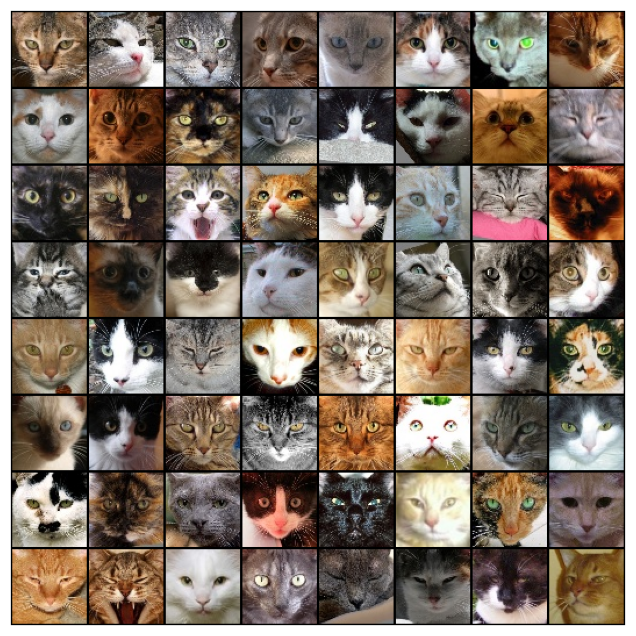

In [ ]:
show_batch(train_dl)

<h2>Implementacja wrappera dla obiektów klasy <i>Dataloader</i></h2>

In [ ]:
def to_device(data, device):
    """
    Przeniesienie wybranej instancji struktury danych
    do pamięci wybranego urządzenia
    """
    if isinstance(data, (list, tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Inicjalizacja wrappera"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        """
        Zwrócenie jednego pakietu danych po przeniesieniu go
        do pamięci wybranego urządzenia
        """
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        """
        Zwrócenie liczby pakietów danych znajdujących się wewnątrz obiektu klasy Dataloader
        """
        return len(self.dl)

<h2>Określenie domyślnego urządzenia na podstawie sprawdzenia dostępności karty graficznej</h2>

In [ ]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

In [ ]:
device

device(type='cuda')

<h2>Wykorzystanie wrappera dla obiektów klasy <i>Dataloader</i></h2>

In [ ]:
train_dl = DeviceDataLoader(train_dl, device)

<h2>Deklaracja wymiarowości przestrzeni wektorowej danych wejściowych generatora</h2>

In [ ]:
latent_size = 128

<h2>Deklaracja podstawowej klasy generatora</h2>

In [ ]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

<h2>Przeniesienie obiektu dyskryminatora do pamięci urządzenia domyślnego</h2>

In [ ]:
generator = to_device(generator, device)

<h2>Deklaracja podstawowej klasy dyskryminatora</h2>

In [ ]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid()
)

<h2>Przeniesienie obiektu dyskryminatora do pamięci urządzenia domyślnego</h2>

In [ ]:
discriminator = to_device(discriminator, device)

<h2>Przygotowanie danych wejściowych dla generatora</h2>

torch.Size([128, 3, 64, 64])


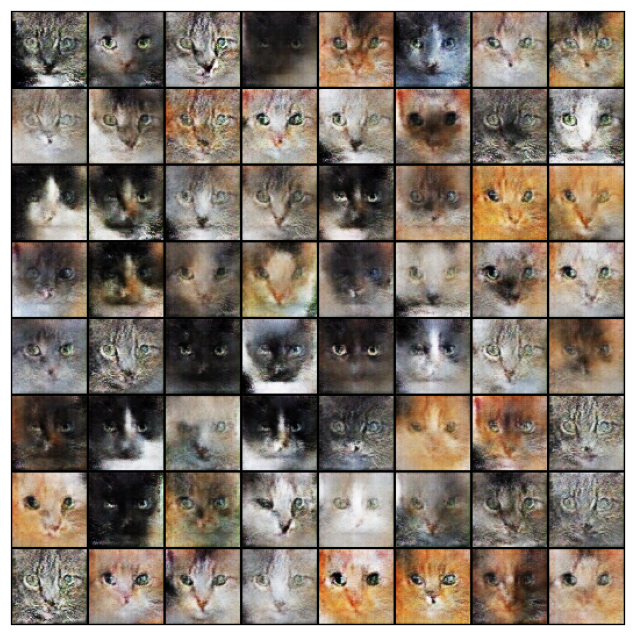

In [ ]:
xb = torch.randn(batch_size, 128, 1, 1, device=device)
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images.cpu())

<h2>Przygotowanie katalogu na obrazy wygenerowane przez model</h2>

In [ ]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

<h2>Inicjalizacja przykładowych danych wejściowych dla generatora</h2>

In [ ]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

<h2>Deklaracja funkcji służącej do zapisywania wygenerowanych obrazów</h2>

In [ ]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = f'generated-images-{index:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

<h2>Wizualizacja procesu uczenia</h2>

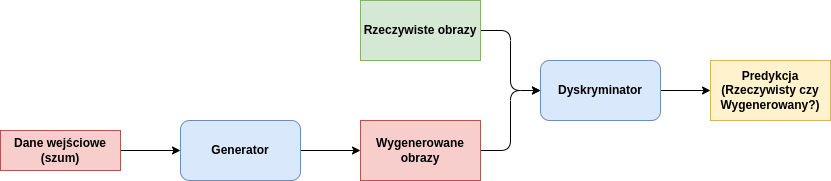

<h2>Przykładowa pętla ucząca</h2>

In [ ]:
# Przykładowa funkcja do zapisywania wygenerowanych obrazów
def save_all_jpg(index, latent_tensors, sample_dir, num_samples=5000):
    fake_images = generator(latent_tensors)
    os.makedirs(sample_dir, exist_ok=True)
    for i in range(num_samples):
      latent = torch.randn(1, latent_size, 1, 1, device=device)
      fake_image = generator(latent)
      fake_fname = os.path.join(sample_dir, f'generated-image-{index * num_samples + i}.jpg')
      save_image(fake_image, fake_fname)

In [ ]:
def fit(model, train_dl, criterion, epochs, lr):
    model["discriminator"].train()
    model["generator"].train()
    torch.cuda.empty_cache()

    # Inicjalizacja struktur danych do przechowywania wartości funkcji straty
    # oraz wyników dla rzeczywistych i wygenerowanych obrazów
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []

    # Inicjalizacja optymalizatora
    optimizer = {
        "discriminator": torch.optim.Adam(model["discriminator"].parameters(),
                                          lr=lr, betas=(0.5, 0.999)),
        "generator": torch.optim.Adam(model["generator"].parameters(),
                                      lr=lr, betas=(0.5, 0.999))
    }

    for epoch in range(epochs):
        loss_d_per_epoch = []
        loss_g_per_epoch = []
        real_score_per_epoch = []
        fake_score_per_epoch = []
        for real_images, _ in tqdm(train_dl):
            # Uczenie modelu dyskryminatora
            # Inicjalizacja wartości gradientu obliczanego przez optymalizator
            optimizer["discriminator"].zero_grad()

            # Wygenerowanie predykcji dla rzeczywistych obrazów
            # oraz obliczenie wartości funkcji straty
            real_preds = model["discriminator"](real_images)
            real_targets = torch.ones(real_images.size(0), 1, device=device)
            real_loss = criterion["discriminator"](real_preds, real_targets)
            cur_real_score = torch.mean(real_preds).item()

            # Wygenerowanie sztucznych obrazów
            latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
            fake_images = model["generator"](latent)

            # Wygenerowanie predykcji dla sztucznych obrazów
            # oraz obliczenie wartości funkcji straty
            fake_preds = model["discriminator"](fake_images)
            fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
            fake_loss = criterion["discriminator"](fake_preds, fake_targets)
            cur_fake_score = torch.mean(fake_preds).item()

            real_score_per_epoch.append(cur_real_score)
            fake_score_per_epoch.append(cur_fake_score)

            # Aktualizacja wag dyskryminatora
            loss_d = real_loss + fake_loss
            loss_d.backward()
            optimizer["discriminator"].step()
            loss_d_per_epoch.append(loss_d.item())

            # Uczenie modelu generatora
            # Inicjalizacja wartości gradientu obliczanego przez optymalizator
            optimizer["generator"].zero_grad()

            # Wygenerowanie sztucznych obrazów
            latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
            fake_images = model["generator"](latent)
            # print(fake_images.shape)

            # Próba oszukania modelu dyskryminatora
            preds = model["discriminator"](fake_images)
            targets = torch.ones(batch_size, 1, device=device)
            loss_g = criterion["generator"](preds, targets)

            # Aktualizacja wag generatora
            loss_g.backward()
            optimizer["generator"].step()
            loss_g_per_epoch.append(loss_g.item())

        # Zapisanie wartości funkcji straty i średnich wartości predykcji w danej epoce
        losses_g.append(np.mean(loss_g_per_epoch))
        losses_d.append(np.mean(loss_d_per_epoch))
        real_scores.append(np.mean(real_score_per_epoch))
        fake_scores.append(np.mean(fake_score_per_epoch))

        # Zapisanie wartości funkcji straty i wyników dla ostatniej porcji danych
        print(f"Epoch [{epoch+1}/{epochs}], loss_g: {losses_g[-1]:.4f}, loss_d: {losses_d[-1]:.4f}, real_score: {real_scores[-1]:.4f}, fake_score: {fake_scores[-1]:.4f}")

        # Zapisanie próbki obrazów wygenerowanych przez generator
        if epoch == epochs - 1:
            save_all_jpg(epoch+1, fixed_latent, sample_dir=sample_dir) #saving all
            # save_samples(epoch+1, fixed_latent, show=False)

    return losses_g, losses_d, real_scores, fake_scores

<h2>Przygotowanie konfiguracji eksperymentu</h2>

# Bazowy model

In [ ]:
model = {
    "discriminator": discriminator.to(device),
    "generator": generator.to(device)
}

criterion = {
    "discriminator": nn.BCELoss(),
    "generator": nn.BCELoss()
}
lr = 0.0002
epochs = 55

In [ ]:
device

device(type='cuda')

<h2>Uruchomienie procesu uczenia</h2>

In [ ]:
history = fit(model, train_dl, criterion, epochs, lr)

<h2>Ekstrakcja wyników eksperymentu</h2>

In [ ]:
losses_g, losses_d, real_scores, fake_scores = history

<h2>Podgląd wygenerowanych obrazów</h2>

In [ ]:
generated_img = cv2.imread(f'./generated/generated-images-00{epochs}.png')
generated_img = generated_img[:, :, [2, 1, 0]]

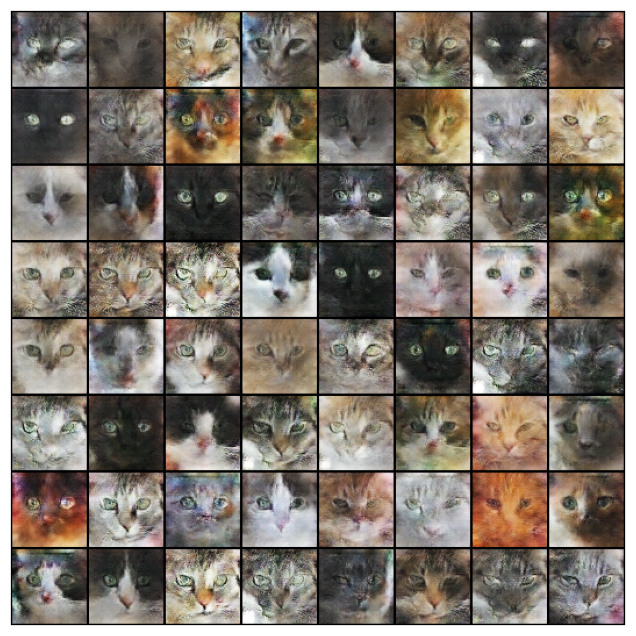

In [ ]:
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(generated_img)

Text(0.5, 1.0, 'Wartość funkcji straty dla dyskryminatora i generatora (oryginał)')

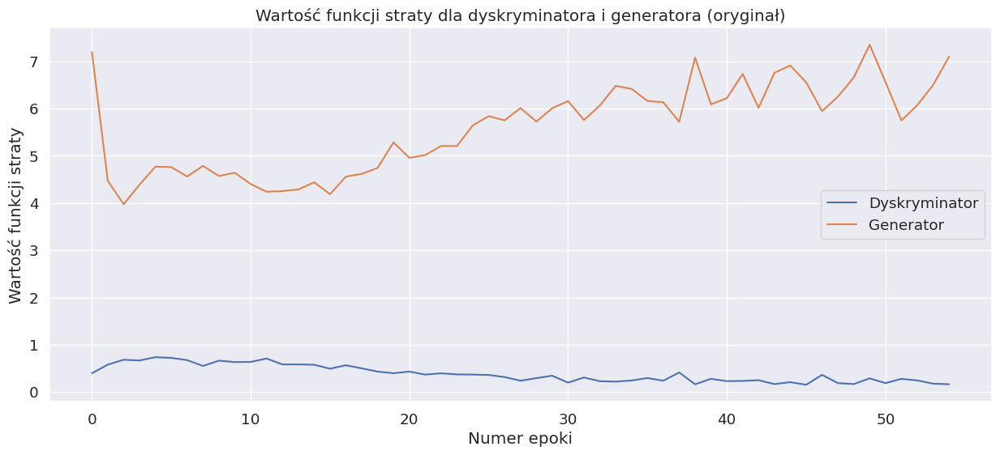

In [ ]:
plt.figure(figsize=(15, 6))
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('Numer epoki')
plt.ylabel('Wartość funkcji straty')
plt.legend(['Dyskryminator', 'Generator'])
plt.title('Wartość funkcji straty dla dyskryminatora i generatora (oryginał)')

Text(0.5, 1.0, 'Średnie wartości predykcji dla rzeczywistych i wygenerowanych obrazów (oryginał)')

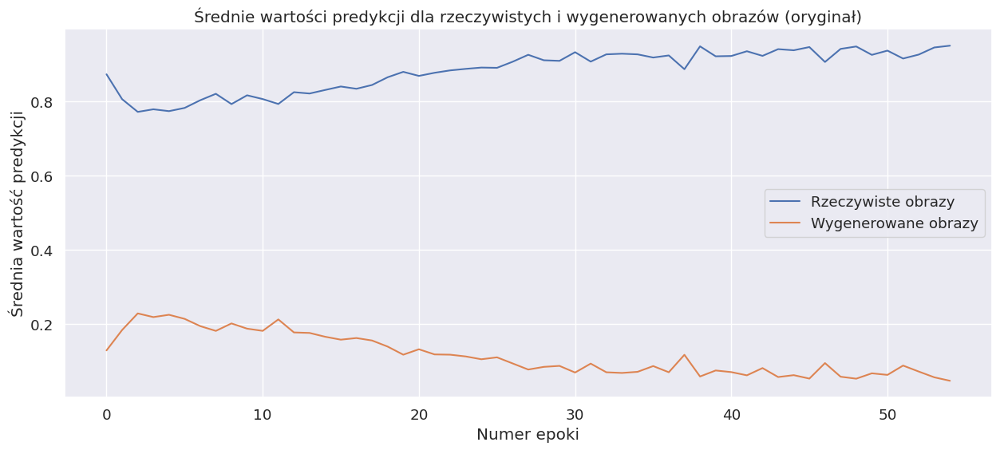

In [ ]:
plt.figure(figsize=(15, 6))

plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('Numer epoki')
plt.ylabel('Średnia wartość predykcji')
plt.legend(['Rzeczywiste obrazy', 'Wygenerowane obrazy'])
plt.title('Średnie wartości predykcji dla rzeczywistych i wygenerowanych obrazów (oryginał)')

#Model testowy 1a. (liczba epok=20)##

In [ ]:
model = {
    "discriminator": discriminator.to(device),
    "generator": generator.to(device)
}

criterion = {
    "discriminator": nn.BCELoss(),
    "generator": nn.BCELoss()
}

lr = 0.0002
epochs = 20

history = fit(model, train_dl, criterion, epochs, lr)

In [ ]:
losses_g, losses_d, real_scores, fake_scores = history

generated_img = cv2.imread(f'./generated/generated-images-00{epochs}.png')
generated_img = generated_img[:, :, [2, 1, 0]]

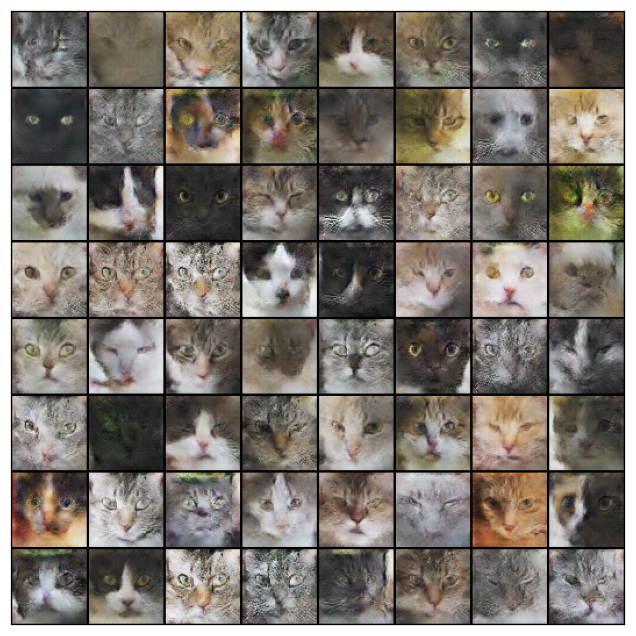

In [ ]:
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(generated_img)

Text(0.5, 1.0, 'Wartość funkcji straty dla dyskryminatora i generatora (epochs=20)')

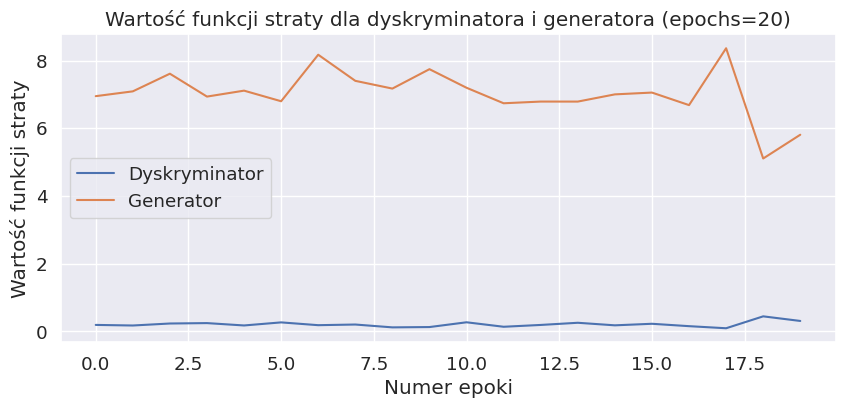

In [ ]:
plt.figure(figsize=(10, 4))
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('Numer epoki')
plt.ylabel('Wartość funkcji straty')
plt.legend(['Dyskryminator', 'Generator'])
plt.title('Wartość funkcji straty dla dyskryminatora i generatora (epochs=20)')

Text(0.5, 1.0, 'Średnie wartości predykcji dla rzeczywistych i wygenerowanych obrazów (epochs=20)')

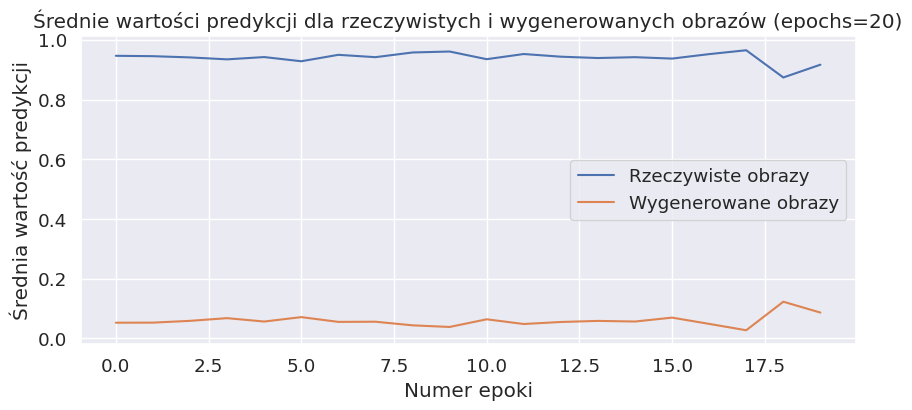

In [ ]:
plt.figure(figsize=(10, 4))

plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('Numer epoki')
plt.ylabel('Średnia wartość predykcji')
plt.legend(['Rzeczywiste obrazy', 'Wygenerowane obrazy'])
plt.title('Średnie wartości predykcji dla rzeczywistych i wygenerowanych obrazów (epochs=20)')

#Model testowy 1b. (liczba epok=35)##

In [ ]:
model = {
    "discriminator": discriminator.to(device),
    "generator": generator.to(device)
}

criterion = {
    "discriminator": nn.BCELoss(),
    "generator": nn.BCELoss()
}

lr = 0.0002
epochs = 35

history = fit(model, train_dl, criterion, epochs, lr)

In [ ]:
losses_g, losses_d, real_scores, fake_scores = history

generated_img = cv2.imread(f'./generated/generated-images-00{epochs}.png')
generated_img = generated_img[:, :, [2, 1, 0]]

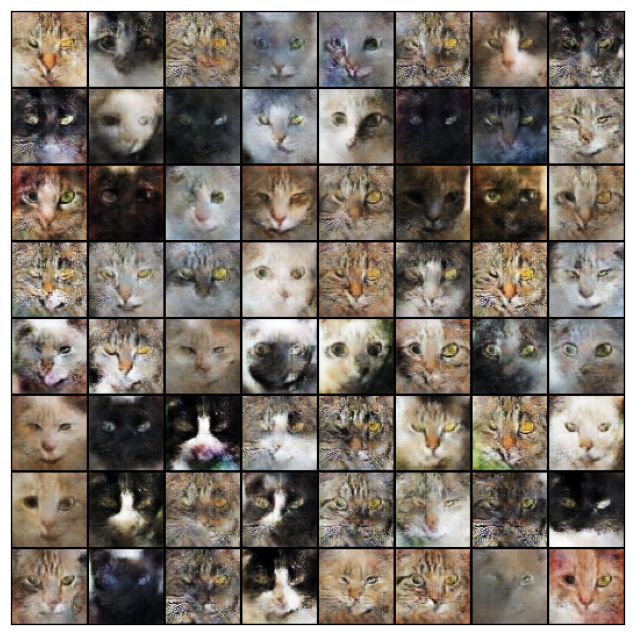

In [ ]:
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(generated_img)

Text(0.5, 1.0, 'Wartość funkcji straty dla dyskryminatora i generatora (epochs=35)')

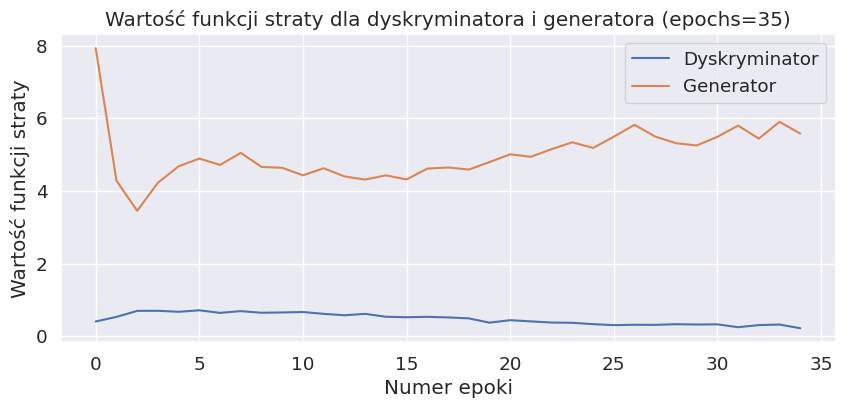

In [ ]:
plt.figure(figsize=(10, 4))
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('Numer epoki')
plt.ylabel('Wartość funkcji straty')
plt.legend(['Dyskryminator', 'Generator'])
plt.title('Wartość funkcji straty dla dyskryminatora i generatora (epochs=35)')

Text(0.5, 1.0, 'Średnie wartości predykcji dla rzeczywistych i wygenerowanych obrazów (epochs=35)')

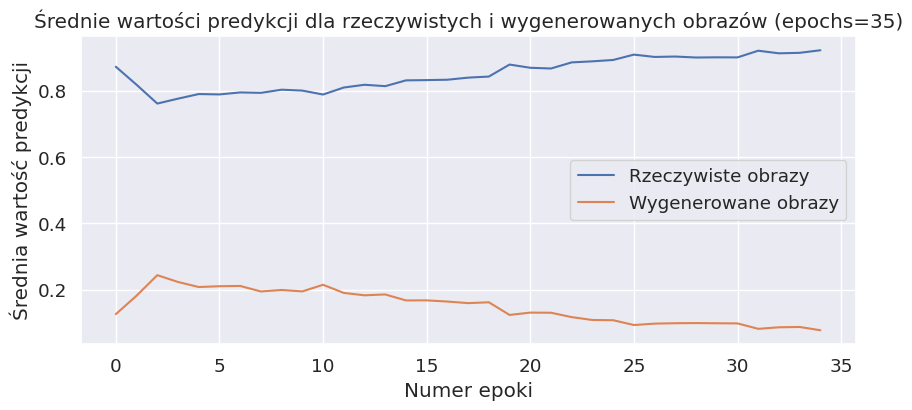

In [ ]:
plt.figure(figsize=(10, 4))

plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('Numer epoki')
plt.ylabel('Średnia wartość predykcji')
plt.legend(['Rzeczywiste obrazy', 'Wygenerowane obrazy'])
plt.title('Średnie wartości predykcji dla rzeczywistych i wygenerowanych obrazów (epochs=35)')

# Model testowy nr 2a. (lr=0.001)##

In [ ]:
model = {
    "discriminator": discriminator.to(device),
    "generator": generator.to(device)
}

criterion = {
    "discriminator": nn.BCELoss(),
    "generator": nn.BCELoss()
}

lr = 0.001
epochs = 55

history = fit(model, train_dl, criterion, epochs, lr)

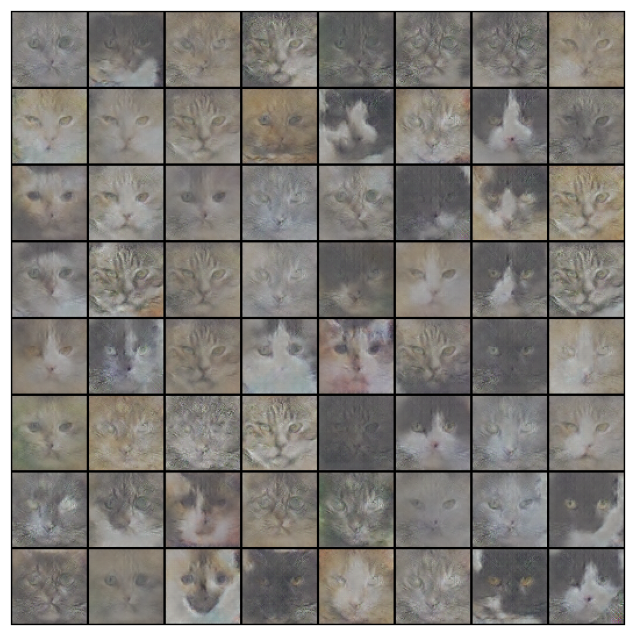

In [ ]:
losses_g, losses_d, real_scores, fake_scores = history

generated_img = cv2.imread(f'./generated/generated-images-00{epochs}.png')
generated_img = generated_img[:, :, [2, 1, 0]]

fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(generated_img)

Text(0.5, 1.0, 'Wartość funkcji straty dla dyskryminatora i generatora (lr=0.001)')

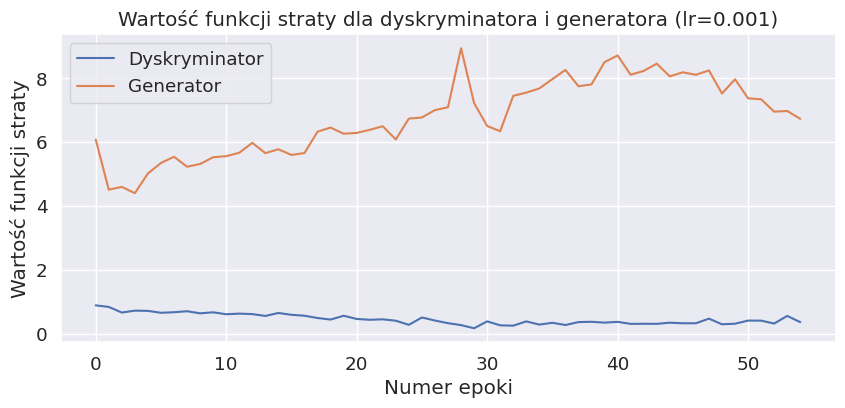

In [ ]:
plt.figure(figsize=(10, 4))
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('Numer epoki')
plt.ylabel('Wartość funkcji straty')
plt.legend(['Dyskryminator', 'Generator'])
plt.title('Wartość funkcji straty dla dyskryminatora i generatora (lr=0.001)')

Text(0.5, 1.0, 'Średnie wartości predykcji dla rzeczywistych i wygenerowanych obrazów (lr=0.001)')

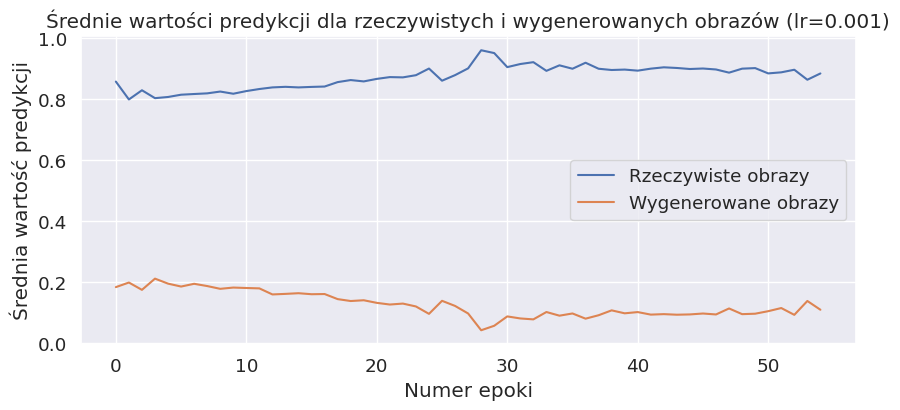

In [ ]:
plt.figure(figsize=(10, 4))

plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('Numer epoki')
plt.ylabel('Średnia wartość predykcji')
plt.legend(['Rzeczywiste obrazy', 'Wygenerowane obrazy'])
plt.title('Średnie wartości predykcji dla rzeczywistych i wygenerowanych obrazów (lr=0.001)')

# Model testowy nr 2b. (lr=0.0001)##

In [ ]:
model = {
    "discriminator": discriminator.to(device),
    "generator": generator.to(device)
}

criterion = {
    "discriminator": nn.BCELoss(),
    "generator": nn.BCELoss()
}

lr = 0.0001
epochs = 55

history = fit(model, train_dl, criterion, epochs, lr)

  0%|          | 0/124 [00:00<?, ?it/s]

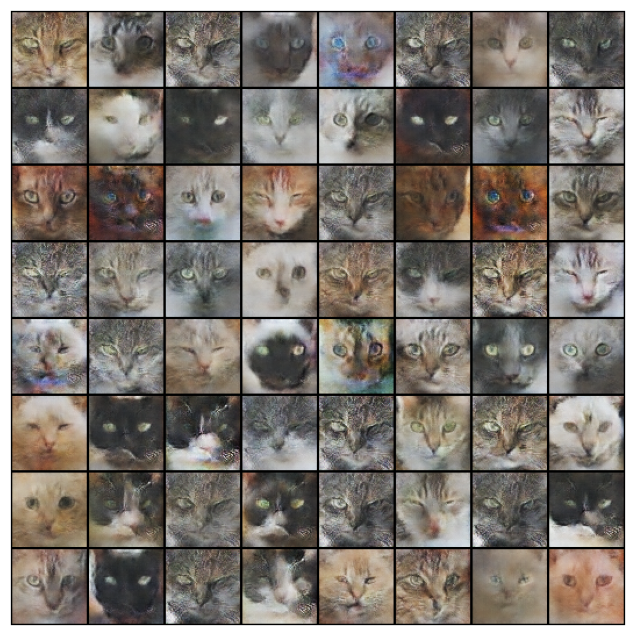

In [ ]:
losses_g, losses_d, real_scores, fake_scores = history

generated_img = cv2.imread(f'./generated/generated-images-00{epochs}.png')
generated_img = generated_img[:, :, [2, 1, 0]]

fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(generated_img)

Text(0.5, 1.0, 'Wartość funkcji straty dla dyskryminatora i generatora (lr=0.00008)')

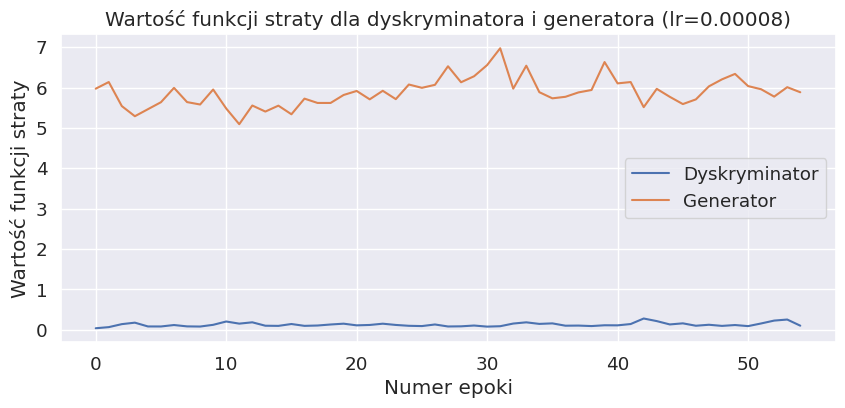

In [ ]:
plt.figure(figsize=(10, 4))
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('Numer epoki')
plt.ylabel('Wartość funkcji straty')
plt.legend(['Dyskryminator', 'Generator'])
plt.title('Wartość funkcji straty dla dyskryminatora i generatora (lr=0.00008)')

Text(0.5, 1.0, 'Średnie wartości predykcji dla rzeczywistych i wygenerowanych obrazów (0.00008)')

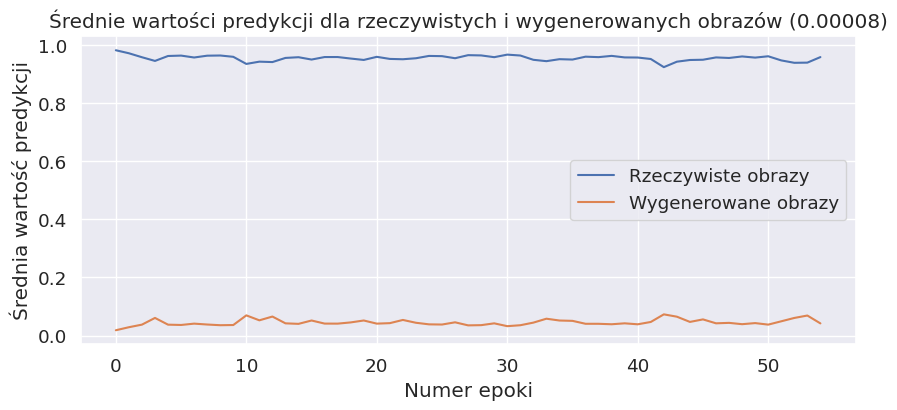

In [ ]:
plt.figure(figsize=(10, 4))

plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('Numer epoki')
plt.ylabel('Średnia wartość predykcji')
plt.legend(['Rzeczywiste obrazy', 'Wygenerowane obrazy'])
plt.title('Średnie wartości predykcji dla rzeczywistych i wygenerowanych obrazów (0.00008)')

# Model testowy nr 3a. (batch_size=64)##

In [ ]:
model = {
    "discriminator": discriminator.to(device),
    "generator": generator.to(device)
}

criterion = {
    "discriminator": nn.BCELoss(),
    "generator": nn.BCELoss()
}

lr = 0.0002
epochs = 55

history = fit(model, train_dl, criterion, epochs, lr)

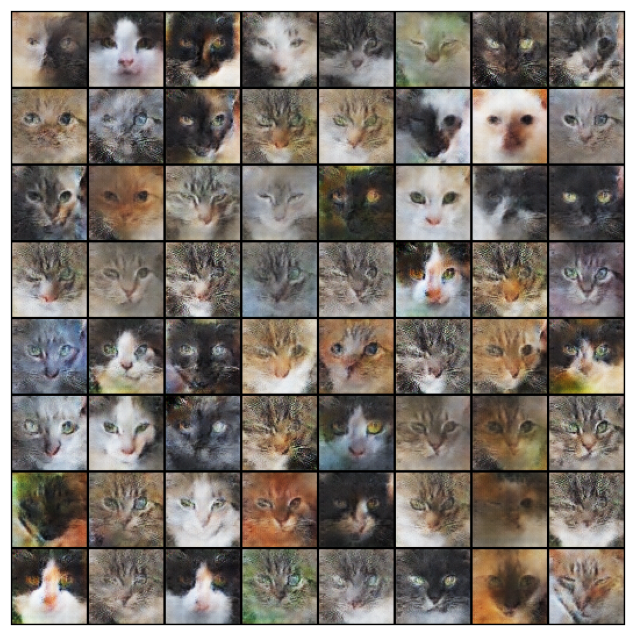

In [ ]:
losses_g, losses_d, real_scores, fake_scores = history

generated_img = cv2.imread(f'./generated/generated-images-00{epochs}.png')
generated_img = generated_img[:, :, [2, 1, 0]]

fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(generated_img)

Text(0.5, 1.0, 'Wartość funkcji straty dla dyskryminatora i generatora (b_s=64)')

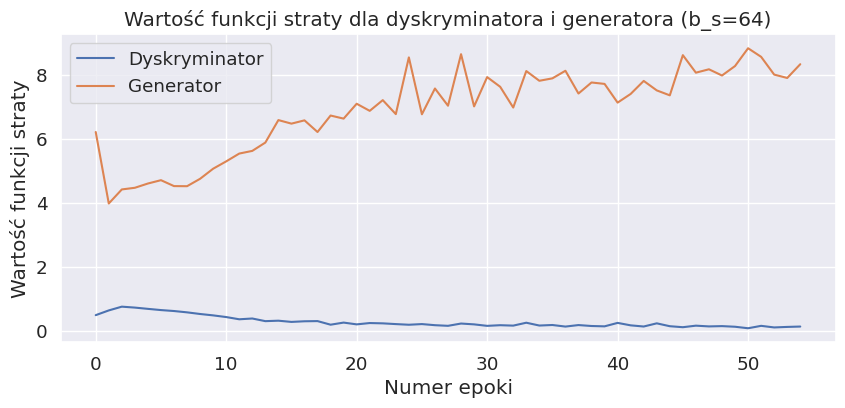

In [ ]:
plt.figure(figsize=(10, 4))
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('Numer epoki')
plt.ylabel('Wartość funkcji straty')
plt.legend(['Dyskryminator', 'Generator'])
plt.title('Wartość funkcji straty dla dyskryminatora i generatora (b_s=64)')

Text(0.5, 1.0, 'Średnie wartości predykcji dla rzeczywistych i wygenerowanych obrazów (b_s=64)')

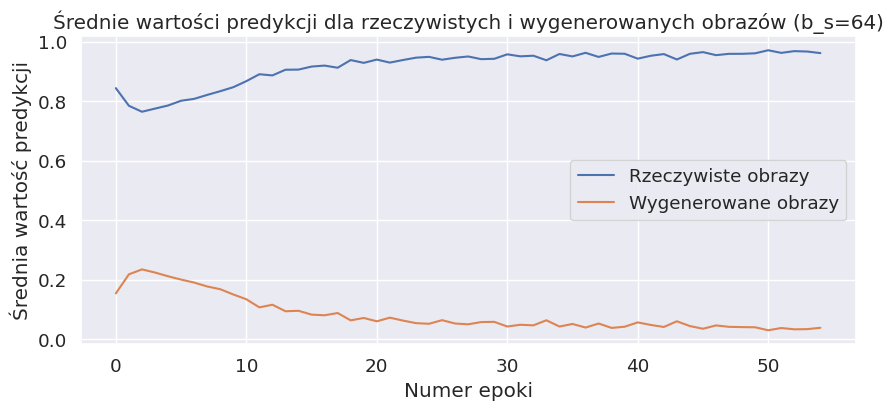

In [ ]:
plt.figure(figsize=(10, 4))

plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('Numer epoki')
plt.ylabel('Średnia wartość predykcji')
plt.legend(['Rzeczywiste obrazy', 'Wygenerowane obrazy'])
plt.title('Średnie wartości predykcji dla rzeczywistych i wygenerowanych obrazów (b_s=64)')

# Model testowy nr 4a. (Mniejsza architekrtura)

torch.Size([128, 3, 64, 64])


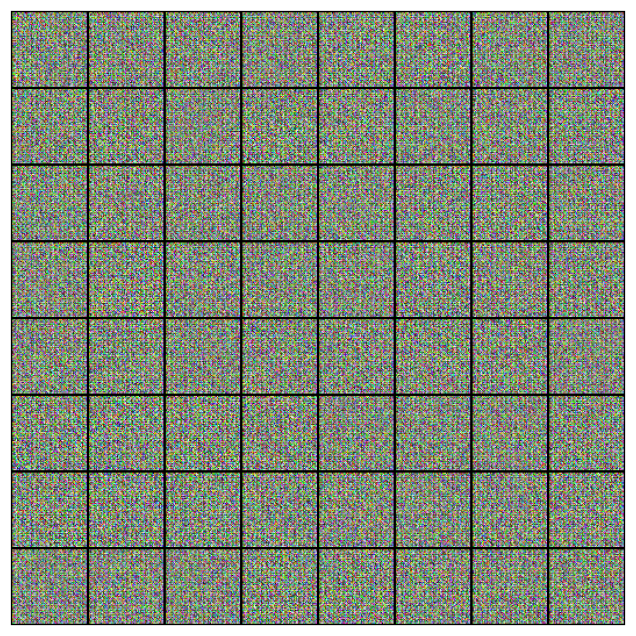

In [ ]:
xb = torch.randn(batch_size, latent_size, 1, 1, device=device)
fake_images = small_generator(xb)
print(fake_images.shape)
show_images(fake_images.cpu())

In [ ]:
latent_size = 128

In [ ]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

In [ ]:
def calculate_transposed(input, kernel, stride, padding):
  return (input - 1)*stride - 2*padding + (kernel-1) + 1

def calculate_normal(input, kernel, stride, padding):
  return 1+ (input + 2*padding - (kernel-1) - 1)/stride

In [ ]:
calculate_normal(32,6,4,1)

8.0

In [ ]:
calculate_transposed(16,4,4,0)

64

In [ ]:
import torch.nn as nn
            #  4        2        0            4
# H/W out = (Hin - 1)*stride - 2*padding + (kernel_size-1) + 1
                #  62     -    2          +    4
# Generator
small_generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 256, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 4 x 4

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=4, padding=0, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 3, kernel_size=4, stride=4, padding=0, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

# Dyskryminator
small_discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32


    nn.Conv2d(128, 256, kernel_size=6, stride=4, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 8 x 8

    nn.Conv2d(256, 1, kernel_size=8, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid()
)



small_generator = to_device(small_generator, device)
small_discriminator = to_device(small_discriminator, device)

In [ ]:
model_small = {
    "discriminator": small_discriminator.to(device),
    "generator": small_generator.to(device)
}

criterion = {
    "discriminator": nn.BCELoss(),
    "generator": nn.BCELoss()
}
lr = 0.0002
epochs = 55

In [ ]:
history = fit(model_small, train_dl, criterion, epochs, lr)

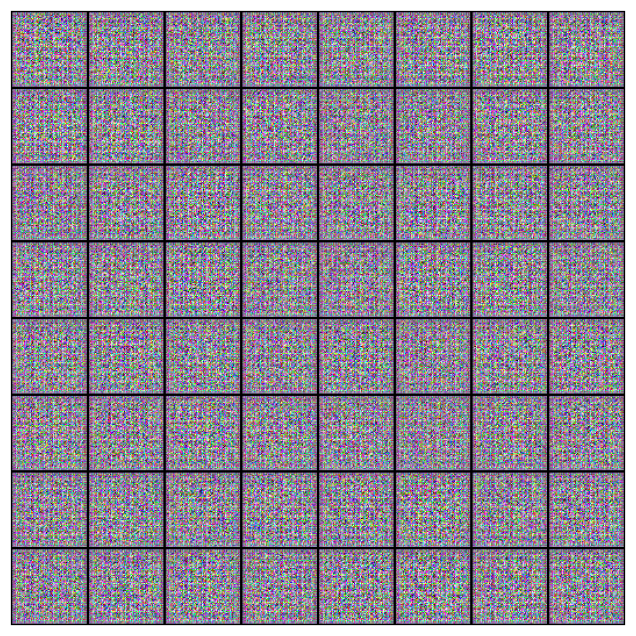

In [ ]:
losses_g, losses_d, real_scores, fake_scores = history

generated_img = cv2.imread(f'./generated/generated-images-00{epochs}.png')
generated_img = generated_img[:, :, [2, 1, 0]]

fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(generated_img)

Text(0.5, 1.0, 'Wartość funkcji straty dla dyskryminatora i generatora (mała architektura)')

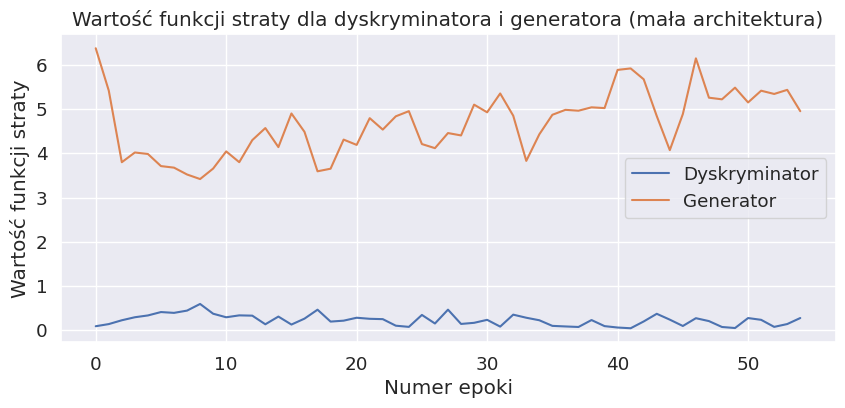

In [ ]:
plt.figure(figsize=(10, 4))
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('Numer epoki')
plt.ylabel('Wartość funkcji straty')
plt.legend(['Dyskryminator', 'Generator'])
plt.title('Wartość funkcji straty dla dyskryminatora i generatora (mała architektura)')

Text(0.5, 1.0, 'Średnie wartości predykcji dla rzeczywistych i wygenerowanych obrazów (mała architektura)')

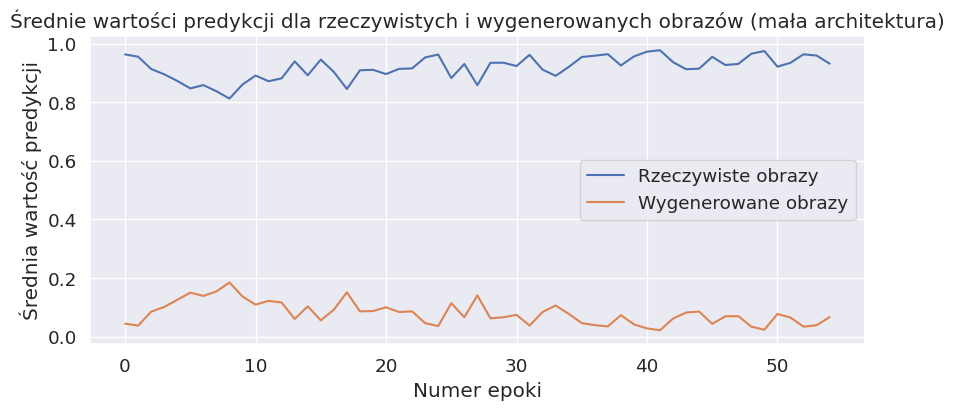

In [ ]:
plt.figure(figsize=(10, 4))

plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('Numer epoki')
plt.ylabel('Średnia wartość predykcji')
plt.legend(['Rzeczywiste obrazy', 'Wygenerowane obrazy'])
plt.title('Średnie wartości predykcji dla rzeczywistych i wygenerowanych obrazów (mała architektura)')

# Model testowy nr 4b. (Większa architektura)

In [ ]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

In [ ]:
def calculate_transposed(input, kernel, stride, padding):
  return (input - 1)*stride - 2*padding + (kernel-1) + 1

def calculate_normal(input, kernel, stride, padding):
  return 1+ (input + 2*padding - (kernel-1) - 1)/stride

In [ ]:
calculate_normal(32,6,4,1)

8.0

In [ ]:
calculate_transposed(24,1,2,4)

39

In [ ]:
calculate_transposed(39,2,2,7)

64

In [ ]:
import torch.nn as nn
            #  4        2        0            4
# H/W out = (Hin - 1)*stride - 2*padding + (kernel_size-1) + 1
                #  62     -    2          +    4
# Generator
big_generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 300, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(300),
    nn.ReLU(True),
    # out: 300 x 8 x 8

    nn.ConvTranspose2d(300, 200, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(200),
    nn.ReLU(True),
    # out: 200 x 16 x 16

    nn.ConvTranspose2d(200, 100, kernel_size=2, stride=2, padding=4, bias=False),
    nn.BatchNorm2d(100),
    nn.ReLU(True),
    # out: 100 x 24 x 24

    nn.ConvTranspose2d(100, 64, kernel_size=1, stride=2, padding=4, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 38 x 38

    nn.ConvTranspose2d(64, 3, kernel_size=2, stride=2, padding=7, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

# Dyskryminator
big_discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid()
)



big_generator = to_device(big_generator, device)
big_discriminator = to_device(big_discriminator, device)

In [ ]:
model_big = {
    "discriminator": big_discriminator.to(device),
    "generator": big_generator.to(device)
}

criterion = {
    "discriminator": nn.BCELoss(),
    "generator": nn.BCELoss()
}
lr = 0.0002
epochs = 8

In [ ]:
history = fit(model_big, train_dl, criterion, epochs, lr)

  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [1/8], loss_g: 34.0019, loss_d: 0.0001, real_score: 0.9999, fake_score: 0.0000


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [2/8], loss_g: 37.7608, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [3/8], loss_g: 37.6236, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [4/8], loss_g: 37.4838, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [5/8], loss_g: 37.3034, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [6/8], loss_g: 37.0602, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [7/8], loss_g: 36.6900, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [8/8], loss_g: 35.9819, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0008.png


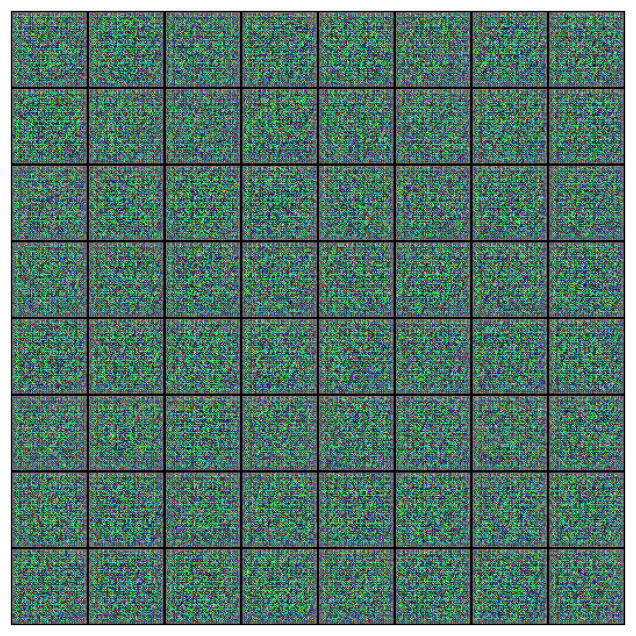

In [ ]:
losses_g, losses_d, real_scores, fake_scores = history

generated_img = cv2.imread(f'./generated/generated-images-000{epochs}.png')
generated_img = generated_img[:, :, [2, 1, 0]]

fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(generated_img)

Text(0.5, 1.0, 'Wartość funkcji straty dla dyskryminatora i generatora (mała architektura)')

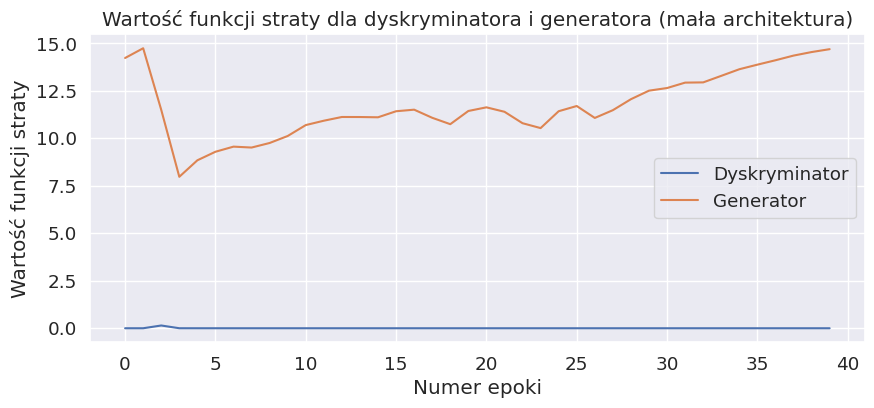

In [ ]:
plt.figure(figsize=(10, 4))
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('Numer epoki')
plt.ylabel('Wartość funkcji straty')
plt.legend(['Dyskryminator', 'Generator'])
plt.title('Wartość funkcji straty dla dyskryminatora i generatora (mała architektura)')

Text(0.5, 1.0, 'Średnie wartości predykcji dla rzeczywistych i wygenerowanych obrazów (mała architektura)')

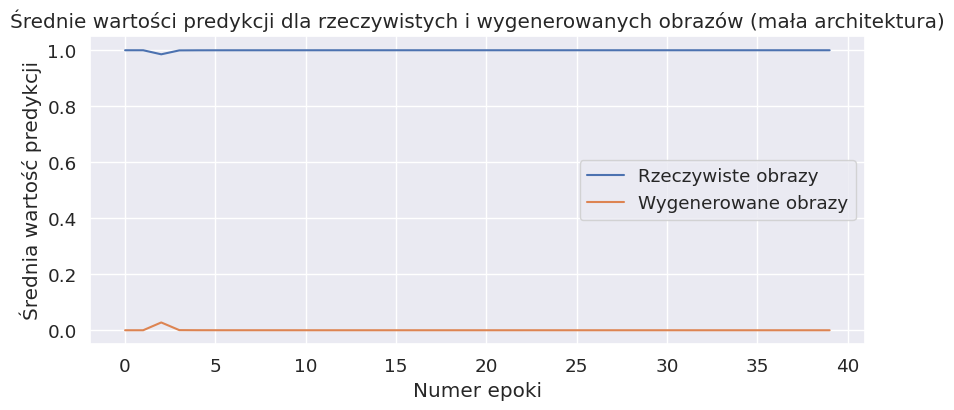

In [ ]:
plt.figure(figsize=(10, 4))

plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('Numer epoki')
plt.ylabel('Średnia wartość predykcji')
plt.legend(['Rzeczywiste obrazy', 'Wygenerowane obrazy'])
plt.title('Średnie wartości predykcji dla rzeczywistych i wygenerowanych obrazów (mała architektura)')

#Other GANs

##WGAN

In [ ]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten()
    # nn.Sigmoid() #niepotrzebne nam prawdopodobeństwo
)

In [ ]:
generator = to_device(generator, device)
discriminator = to_device(discriminator, device)

In [ ]:
#inna funkcja straty
class WassersteinLoss(nn.Module):
    def __init__(self):
        super(WassersteinLoss, self).__init__()

    def forward(self, outputs, targets):
        return -torch.mean(targets * outputs)

In [ ]:
#Kara wykorzystująca interpolację org i gen obrazków
def gradient_penalty(discriminator, image_real, image_fake, device):
    t = torch.full(image_real.shape, np.random.rand(1)[0]).to(device)
    # print(image_real.shape, image_fake.shape)
    interpolation = t * image_real + (1 - t) * image_fake
    interpolation.requires_grad_()

    preds = discriminator(interpolation)
    grads = torch.autograd.grad(outputs=preds, inputs=interpolation,
                          grad_outputs=torch.ones_like(preds),
                          create_graph=True, retain_graph=True, only_inputs=True)[0]

    gp = torch.pow(grads.norm(2, dim=1) - 1, 2).mean()

    return gp

In [ ]:
def fit(model, train_dl, criterion, epochs, lr):
    model["discriminator"].train()
    model["generator"].train()
    torch.cuda.empty_cache()

    # Inicjalizacja struktur danych do przechowywania wartości funkcji straty
    # oraz wyników dla rzeczywistych i wygenerowanych obrazów
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []

    # Inicjalizacja optymalizatora
    optimizer = {
        "discriminator": torch.optim.Adam(model["discriminator"].parameters(),
                                          lr=lr, betas=(0.5, 0.999)),
        "generator": torch.optim.Adam(model["generator"].parameters(),
                                      lr=lr, betas=(0.5, 0.999))
    }

    for epoch in range(epochs):
        loss_d_per_epoch = []
        loss_g_per_epoch = []
        real_score_per_epoch = []
        fake_score_per_epoch = []
        i=0
        for real_images, _ in tqdm(train_dl):
            # Uczenie modelu dyskryminatora
            # Inicjalizacja wartości gradientu obliczanego przez optymalizator
            optimizer["discriminator"].zero_grad()

            real_preds = model["discriminator"](real_images)
            # print('ffff')
            real_targets = torch.ones(real_images.size(0), 1, device=device)
            real_loss = criterion["discriminator"](real_preds, real_targets)
            cur_real_score = torch.mean(real_preds).item()


            latent = torch.randn(real_images.shape[0], latent_size, 1, 1).to(device)
            fake_images = model["generator"](latent)

            # Wygenerowanie predykcji dla sztucznych obrazów
            # oraz obliczenie wartości funkcji straty
            fake_preds = model["discriminator"](fake_images)
            fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
            fake_loss = criterion["discriminator"](fake_preds, fake_targets)
            cur_fake_score = torch.mean(fake_preds).item()

            real_score_per_epoch.append(cur_real_score)
            fake_score_per_epoch.append(cur_fake_score)

            gp = gradient_penalty(model["discriminator"], real_images, fake_images, device)

            # Update discriminator weights
            loss_d = real_loss + fake_loss + 0.2 * gp
            loss_d.backward()
            optimizer["discriminator"].step()
            loss_d_per_epoch.append(loss_d.item())


            # Trenowanie generatora co 5 iterację
            if i % 5 == 0:
                # Clear generator gradients
                optimizer["generator"].zero_grad()

                # Wygenerowanie sztucznych obrazów
                latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
                fake_images = model["generator"](latent)

                # Próba oszukania modelu dyskryminatora
                preds = model["discriminator"](fake_images)
                targets = torch.ones(batch_size, 1, device=device)
                loss_g = criterion["generator"](preds, targets)

                # Aktualizacja wag generatora
                loss_g.backward()
                optimizer["generator"].step()
                loss_g_per_epoch.append(loss_g.item())
            i+=1

        # Record losses & scores
        losses_g.append(np.mean(loss_g_per_epoch))
        losses_d.append(np.mean(loss_d_per_epoch))
        real_scores.append(np.mean(real_score_per_epoch))
        fake_scores.append(np.mean(fake_score_per_epoch))


        print(f"Epoch [{epoch+1}/{epochs}], loss_g: {losses_g[-1]:.4f}, loss_d: {losses_d[-1]:.4f}, real_score: {real_scores[-1]:.4f}, fake_score: {fake_scores[-1]:.4f}")


        # Zapisanie próbki obrazów wygenerowanych przez generator
        if epoch == epochs - 1:
            save_samples(epoch+1, fixed_latent, show=False)

    return losses_g, losses_d, real_scores, fake_scores

In [ ]:
model = {
    "discriminator": discriminator.to(device),
    "generator": generator.to(device)
}

criterion = {
    "discriminator": WassersteinLoss(),
    "generator": WassersteinLoss()
}

lr = 0.0002
epochs = 10

In [ ]:
history = fit(model, train_dl, criterion, epochs, lr)

  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [1/10], loss_g: -86.4887, loss_d: -86.9365, real_score: 87.1261, fake_score: 87.6257


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [2/10], loss_g: -236.6691, loss_d: -232.9370, real_score: 233.1238, fake_score: 237.3371


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [3/10], loss_g: -397.4262, loss_d: -392.5739, real_score: 392.7567, fake_score: 398.1572


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [4/10], loss_g: -572.0033, loss_d: -567.2708, real_score: 567.4469, fake_score: 572.9496


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [5/10], loss_g: -766.9291, loss_d: -760.6259, real_score: 760.8044, fake_score: 767.8642


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [6/10], loss_g: -976.8573, loss_d: -969.3178, real_score: 969.4895, fake_score: 977.8206


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [7/10], loss_g: -1203.3374, loss_d: -1196.2927, real_score: 1196.4612, fake_score: 1204.4731


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [8/10], loss_g: -1446.2805, loss_d: -1438.9064, real_score: 1439.0741, fake_score: 1447.5195


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [9/10], loss_g: -1703.1832, loss_d: -1692.4912, real_score: 1692.6542, fake_score: 1704.9187


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [10/10], loss_g: -1982.8785, loss_d: -1973.0950, real_score: 1973.2588, fake_score: 1984.3087
Saving generated-images-0010.png


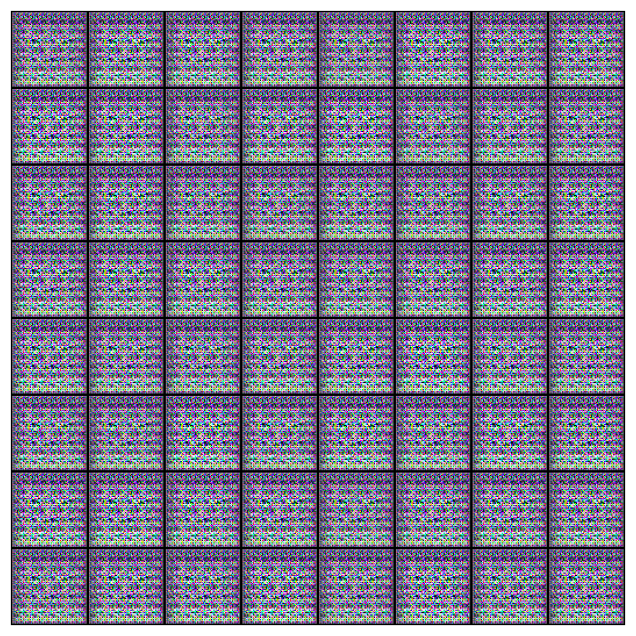

In [ ]:
losses_g, losses_d, real_scores, fake_scores = history

generated_img = cv2.imread(f'./generated/generated-images-00{epochs}.png')
generated_img = generated_img[:, :, [2, 1, 0]]

fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(generated_img)

Text(0.5, 1.0, 'Wartość funkcji straty dla dyskryminatora i generatora (mała architektura)')

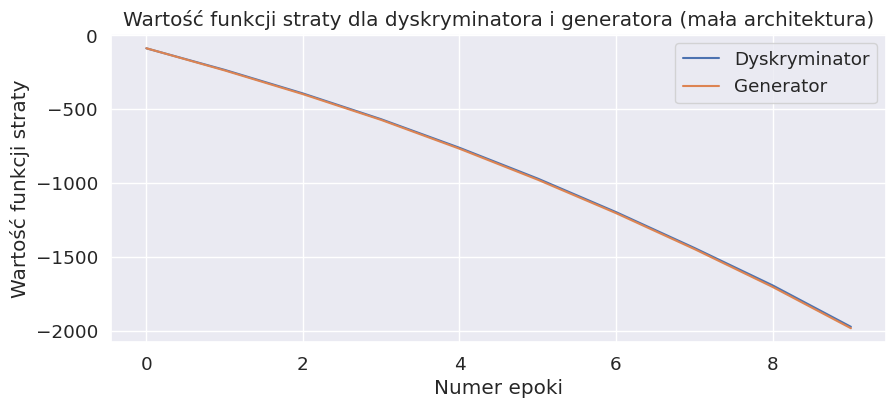

In [ ]:
plt.figure(figsize=(10, 4))
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('Numer epoki')
plt.ylabel('Wartość funkcji straty')
plt.legend(['Dyskryminator', 'Generator'])
plt.title('Wartość funkcji straty dla dyskryminatora i generatora (mała architektura)')

Text(0.5, 1.0, 'Średnie wartości predykcji dla rzeczywistych i wygenerowanych obrazów (mała architektura)')

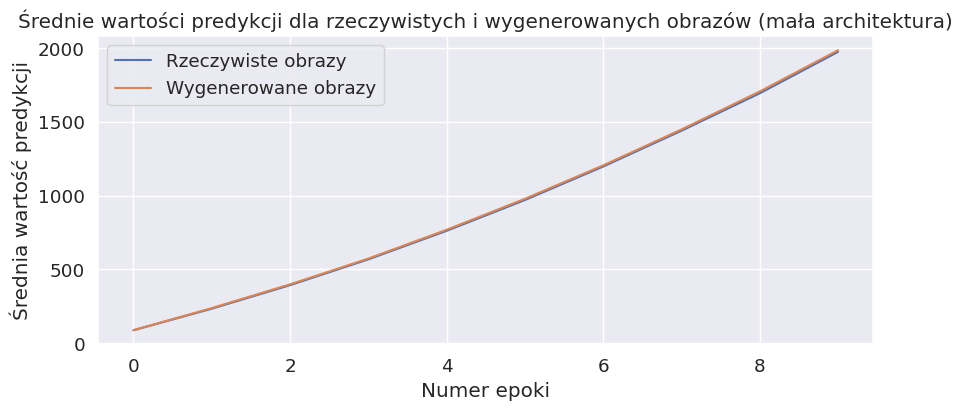

In [ ]:
plt.figure(figsize=(10, 4))

plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('Numer epoki')
plt.ylabel('Średnia wartość predykcji')
plt.legend(['Rzeczywiste obrazy', 'Wygenerowane obrazy'])
plt.title('Średnie wartości predykcji dla rzeczywistych i wygenerowanych obrazów (mała architektura)')

https://github.com/lukemelas/pytorch-pretrained-gans

#Ewaulacja

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from PIL import Image

In [ ]:
generated_images = []

for filename in os.listdir('generated'):
    if filename.endswith('.jpg'):
        img = Image.open(os.path.join('generated', filename))
        generated_images.append(np.array(img))

In [ ]:
original_images = []

for filename in os.listdir(DATA_DIR):
    if filename.endswith('.jpg'):
        img = Image.open(os.path.join(DATA_DIR, filename))
        original_images.append(np.array(img))

In [ ]:
#Użycie resnet50 do ekstrakcji cech
import torchvision.transforms as transforms
from torchvision.models import resnet50

resnet_model = resnet50(pretrained=True).to(device)
resnet_model.eval()

def get_image_embedding(image_array, model):
    preprocess = transforms.Compose([
        transforms.ToTensor(),
    ])

    image = preprocess(image_array)
    image = image.unsqueeze(0).to(device)

    with torch.no_grad():
        embeddings = model(image)

    return embeddings

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 315MB/s]


In [ ]:
# listy embedingów oryginalnych i generowanych
org_image_embeddings = []
gan_image_embeddings = []

for image_array in original_images[:5000]:
    embeddings = get_image_embedding(image_array, resnet_model)
    org_image_embeddings.append(np.array(embeddings.cpu()))

for image_array in generated_images[:5000]:
    embeddings = get_image_embedding(image_array, resnet_model)
    gan_image_embeddings.append(np.array(embeddings.cpu()))

In [ ]:
org_image_embeddings = np.array(org_image_embeddings)
org_image_embeddings = org_image_embeddings.reshape(org_image_embeddings.shape[0], -1)

gan_image_embeddings = np.array(gan_image_embeddings)
gan_image_embeddings = gan_image_embeddings.reshape(gan_image_embeddings.shape[0], -1)

# PCA
n_components = 2
pca = PCA(n_components=n_components)
pca_gan = pca.fit_transform(gan_image_embeddings)

n_components = 2
pca = PCA(n_components=n_components)
pca_org = pca.fit_transform(org_image_embeddings)

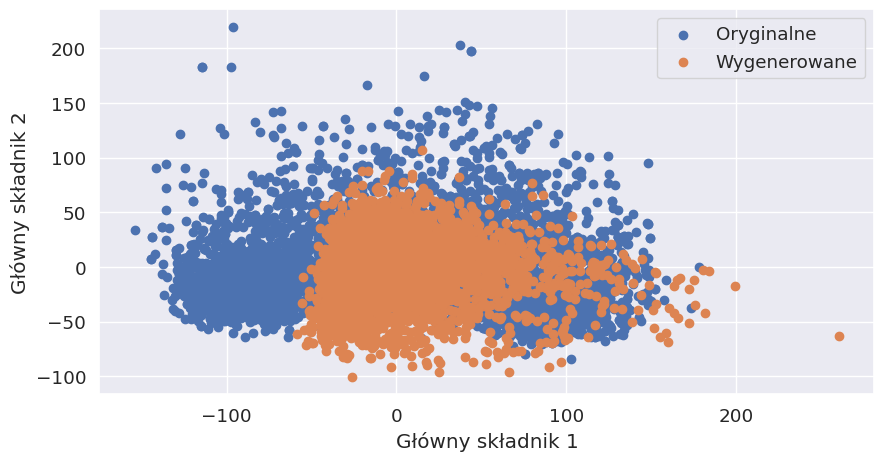

In [ ]:
plt.figure(figsize=(10, 5))
plt.scatter(pca_org[:, 0], pca_org[:, 1], label='Oryginalne')
plt.xlabel('Główny składnik 1')
plt.ylabel('Główny składnik 2')
plt.legend()

plt.scatter(pca_gan[:, 0], pca_gan[:, 1], label='Wygenerowane')
plt.xlabel('Główny składnik 1')
plt.ylabel('Główny składnik 2')
plt.legend()